## Text Preprocessing & Advanced Feature Engineering

### 1. Loading necessary libraries

In [1]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from os import path
import re
import distance
from bs4 import BeautifulSoup
from fuzzywuzzy import fuzz
from wordcloud import WordCloud, STOPWORDS

# NLTK
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords

# Sklearn
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler

# Plotly
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.offline as py
py.init_notebook_mode(connected=True)

### 2. Reading data

In [2]:
if os.path.isfile('df_fe_without_preprocessing_train.csv'):
    df = pd.read_csv("df_fe_without_preprocessing_train.csv",encoding='latin-1')
    df = df.fillna('')
else:
    print("Download 'df_fe_without_preprocessing_train.csv' from the above link or run the previous notebook")

In [3]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,freq_q1+q2,freq_q1-q2,word_Common,word_Total,word_share
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0,1,1,66,57,14,12,2,0,10.0,23.0,0.434783
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0,4,1,51,88,8,13,5,3,4.0,20.0,0.200000
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0,1,1,73,59,14,10,2,0,4.0,24.0,0.166667


In [4]:
df.shape

(404290, 17)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404290 entries, 0 to 404289
Data columns (total 17 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            404290 non-null  int64  
 1   qid1          404290 non-null  int64  
 2   qid2          404290 non-null  int64  
 3   question1     404290 non-null  object 
 4   question2     404290 non-null  object 
 5   is_duplicate  404290 non-null  int64  
 6   freq_qid1     404290 non-null  int64  
 7   freq_qid2     404290 non-null  int64  
 8   q1len         404290 non-null  int64  
 9   q2len         404290 non-null  int64  
 10  q1_n_words    404290 non-null  int64  
 11  q2_n_words    404290 non-null  int64  
 12  freq_q1+q2    404290 non-null  int64  
 13  freq_q1-q2    404290 non-null  int64  
 14  word_Common   404290 non-null  float64
 15  word_Total    404290 non-null  float64
 16  word_share    404290 non-null  float64
dtypes: float64(3), int64(12), object(2)
memory usage

### 3. Text preprocessing

- __Preprocessing:__
    - Lower casing
    - Removing HTML tags 
    - Removing Punctuations
    - Performing Stemming
    - Removing Stopwords
    - Expanding contractions etc.

In [6]:
# To get the results in 4 decemal points
SAFE_DIV = 0.0001 

STOP_WORDS = stopwords.words("english")

def preprocess(q):
    """
    Function to preprocess each question.
    """
    
    # Lower casing
    q = str(q).lower().strip()

    # Replace certain special characters with their string equivalents
    q = q.replace('%', ' percent')
    q = q.replace('$', ' dollar ')
    q = q.replace('₹', ' rupee ')
    q = q.replace('€', ' euro ')
    q = q.replace('@', ' at ')

    # The pattern '[math]' appears around 900 times in the whole dataset.
    # q = q.replace('[math]', '')

    # Replacing some numbers with string equivalents
    q = q.replace(',000,000,000 ', 'b ')
    q = q.replace(',000,000 ', 'm ')
    q = q.replace(',000 ', 'k ')
    q = re.sub(r'([0-9]+)000000000', r'\1b', q)
    q = re.sub(r'([0-9]+)000000', r'\1m', q)
    q = re.sub(r'([0-9]+)000', r'\1k', q)
    
    # Decontracting words
    contractions = {
        "ain't": "am not",
        "aren't": "are not",
        "can't": "can not",
        "can't've": "can not have",
        "'cause": "because",
        "could've": "could have",
        "couldn't": "could not",
        "couldn't've": "could not have",
        "didn't": "did not",
        "doesn't": "does not",
        "don't": "do not",
        "hadn't": "had not",
        "hadn't've": "had not have",
        "hasn't": "has not",
        "haven't": "have not",
        "he'd": "he would",
        "he'd've": "he would have",
        "he'll": "he will",
        "he'll've": "he will have",
        "he's": "he is",
        "how'd": "how did",
        "how'd'y": "how do you",
        "how'll": "how will",
        "how's": "how is",
        "i'd": "i would",
        "i'd've": "i would have",
        "i'll": "i will",
        "i'll've": "i will have",
        "i'm": "i am",
        "i've": "i have",
        "isn't": "is not",
        "it'd": "it would",
        "it'd've": "it would have",
        "it'll": "it will",
        "it'll've": "it will have",
        "it's": "it is",
        "let's": "let us",
        "ma'am": "madam",
        "mayn't": "may not",
        "might've": "might have",
        "mightn't": "might not",
        "mightn't've": "might not have",
        "must've": "must have",
        "mustn't": "must not",
        "mustn't've": "must not have",
        "needn't": "need not",
        "needn't've": "need not have",
        "o'clock": "of the clock",
        "oughtn't": "ought not",
        "oughtn't've": "ought not have",
        "shan't": "shall not",
        "sha'n't": "shall not",
        "shan't've": "shall not have",
        "she'd": "she would",
        "she'd've": "she would have",
        "she'll": "she will",
        "she'll've": "she will have",
        "she's": "she is",
        "should've": "should have",
        "shouldn't": "should not",
        "shouldn't've": "should not have",
        "so've": "so have",
        "so's": "so as",
        "that'd": "that would",
        "that'd've": "that would have",
        "that's": "that is",
        "there'd": "there would",
        "there'd've": "there would have",
        "there's": "there is",
        "they'd": "they would",
        "they'd've": "they would have",
        "they'll": "they will",
        "they'll've": "they will have",
        "they're": "they are",
        "they've": "they have",
        "to've": "to have",
        "wasn't": "was not",
        "we'd": "we would",
        "we'd've": "we would have",
        "we'll": "we will",
        "we'll've": "we will have",
        "we're": "we are",
        "we've": "we have",
        "weren't": "were not",
        "what'll": "what will",
        "what'll've": "what will have",
        "what're": "what are",
        "what's": "what is",
        "what've": "what have",
        "when's": "when is",
        "when've": "when have",
        "where'd": "where did",
        "where's": "where is",
        "where've": "where have",
        "who'll": "who will",
        "who'll've": "who will have",
        "who's": "who is",
        "who've": "who have",
        "why's": "why is",
        "why've": "why have",
        "will've": "will have",
        "won't": "will not",
        "won't've": "will not have",
        "would've": "would have",
        "wouldn't": "would not",
        "wouldn't've": "would not have",
        "y'all": "you all",
        "y'all'd": "you all would",
        "y'all'd've": "you all would have",
        "y'all're": "you all are",
        "y'all've": "you all have",
        "you'd": "you would",
        "you'd've": "you would have",
        "you'll": "you will",
        "you'll've": "you will have",
        "you're": "you are",
        "you've": "you have"
    }

    q_decontracted = []

    for word in q.split():
        if word in contractions:
            word = contractions[word]

        q_decontracted.append(word)

    q = ' '.join(q_decontracted)
    q = q.replace("'ve", " have")
    q = q.replace("n't", " not")
    q = q.replace("'re", " are")
    q = q.replace("'ll", " will")
    
    # Removing HTML tags
    q = BeautifulSoup(q)
    q = q.get_text()

    # Remove punctuations
    pattern = re.compile('\W')
    q = re.sub(pattern, ' ', q).strip()
    
#     # Lemmatization
#     lemmatizer = WordNetLemmatizer()
#     words = q.split()
#     words = [lemmatizer.lemmatize(word,pos='v') for word in words]
#     q = ' '.join(words)
#     df['question1'] = df['question1'].apply(lemmatize_words)
#     df['question2'] = df['question2'].apply(lemmatize_words)

    # Stemming
    porter = PorterStemmer()
    
    if type(q) == type(''):
        q = " ".join([porter.stem(word) for word in q.split()])
    
    return q

In [7]:
df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,freq_q1+q2,freq_q1-q2,word_Common,word_Total,word_share
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0,1,1,66,57,14,12,2,0,10.0,23.0,0.434783
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0,4,1,51,88,8,13,5,3,4.0,20.0,0.200000


### 4. Advanced Feature Engineering (after preprocessing) 

- __Token:__ Token is obtained by splitting a document into paragraphs, a paragraph into sentences, a sentence into words and a word into characters.
- __Stopwords__: Set of commonly used words in any language that do not carry any meaning.
- __Word:__ A token that is not a stopword.

Constructing 3 types of features:
- __Token features__
- __Length based features__
- __Fuzzy features__
<br>

Total features: 15

__Token features:__

1. __cwc_min__ : This is the ratio of the number of common words to the length of the smaller question.<br>
cwc_min = common_word_count / (min(len(q1_words), len(q2_words))
<br>
<br>
2. __cwc_max__ : This is the ratio of the number of common words to the length of the larger question.<br>
cwc_max = common_word_count / (max(len(q1_words), len(q2_words))
<br>
<br>
3. __csc_min__ : This is the ratio of the number of common stopwords to the smaller stopword count among the two questions.<br>
csc_min = common_stop_count / (min(len(q1_stops), len(q2_stops))
<br>
<br>
4. __csc_max__ : This is the ratio of the number of common stopwords to the larger stopword count among the two questions.<br>
csc_max = common_stop_count / (max(len(q1_stops), len(q2_stops))
<br>
<br>
5. __ctc_min__ : This is the ratio of the number of common tokens to the smaller token count among the two questions.<br>
ctc_min = common_token_count / (min(len(q1_tokens), len(q2_tokens))
<br>
<br>
6. __ctc_max__ : This is the ratio of the number of common tokens to the larger token count among the two questions.<br>
ctc_max = common_token_count / (max(len(q1_tokens), len(q2_tokens))
<br>
<br>
7. __last_word_eq:__ 1 if the last word in the two questions is same, 0 otherwise.<br>
last_word_eq = int(q1_tokens[-1] == q2_tokens[-1])
<br>
<br>
8. __first_word_equal__ : 1 if the first word in the two questions is same, 0 otherwise.<br>
first_word_eq = int(q1_tokens[0] == q2_tokens[0])

__Length based features:__

1. __mean_len__ : Average token length of both questions.<br>
mean_len = (len(q1_tokens) + len(q2_tokens))/2
<br>
<br>
2. __abs_len_diff__ : Absolute difference between the length of the two questions.<br>
abs_len_diff = abs(len(q1_tokens) - len(q2_tokens))
<br>
<br>
3. __longest_substr_ratio__ : Ratio of the length of the longest substring among the two questions to the length of the smaller question.<br>
longest_substr_ratio = len(longest common substring) / (min(len(q1_tokens), len(q2_tokens))

__Fuzzy features:__

1. __fuzz_ratio__ : fuzz_ratio score from fuzzywuzzy.
<br>
2. __fuzz_partial_ratio__ : fuzz_partial_ratio from fuzzywuzzy.
<br>
3. __token_sort_ratio__ : token_sort_ratio from fuzzywuzzy.
<br>
4. __token_set_ratio__ : token_set_ratio from fuzzywuzzy.

In [8]:
def get_token_features(q1, q2):
    token_features = [0.0]*10
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()

    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features
    
    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    
    # Get the common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))
    
    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
    
    
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    # Last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    # First word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    token_features[8] = abs(len(q1_tokens) - len(q2_tokens))
    
    #Average Token Length of both Questions
    token_features[9] = (len(q1_tokens) + len(q2_tokens))/2
    return token_features

# get the Longest Common sub string
def get_longest_substr_ratio(a, b):
    strs = list(distance.lcsubstrings(a, b))
    if len(strs) == 0:
        return 0
    else:
        return len(strs[0]) / (min(len(a), len(b)) + 1)

def extract_features(df):
    
    # preprocessing each question
    df["question1"] = df["question1"].fillna("").apply(preprocess)
    df["question2"] = df["question2"].fillna("").apply(preprocess)

    print("token features...")
    
    # Merging Features with dataset
    token_features = df.apply(lambda x: get_token_features(x["question1"], x["question2"]), axis=1)
    
    df["cwc_min"]       = list(map(lambda x: x[0], token_features))
    df["cwc_max"]       = list(map(lambda x: x[1], token_features))
    df["csc_min"]       = list(map(lambda x: x[2], token_features))
    df["csc_max"]       = list(map(lambda x: x[3], token_features))
    df["ctc_min"]       = list(map(lambda x: x[4], token_features))
    df["ctc_max"]       = list(map(lambda x: x[5], token_features))
    df["last_word_eq"]  = list(map(lambda x: x[6], token_features))
    df["first_word_eq"] = list(map(lambda x: x[7], token_features))
    df["abs_len_diff"]  = list(map(lambda x: x[8], token_features))
    df["mean_len"]      = list(map(lambda x: x[9], token_features))
   
    #Computing Fuzzy Features and Merging with Dataset
    print("fuzzy features..")

    df["token_set_ratio"]       = df.apply(lambda x: fuzz.token_set_ratio(x["question1"], x["question2"]), axis=1)
    df["token_sort_ratio"]      = df.apply(lambda x: fuzz.token_sort_ratio(x["question1"], x["question2"]), axis=1)
    df["fuzz_ratio"]            = df.apply(lambda x: fuzz.QRatio(x["question1"], x["question2"]), axis=1)
    df["fuzz_partial_ratio"]    = df.apply(lambda x: fuzz.partial_ratio(x["question1"], x["question2"]), axis=1)
    df["longest_substr_ratio"]  = df.apply(lambda x: get_longest_substr_ratio(x["question1"], x["question2"]), axis=1)
    
    return df

In [9]:
if os.path.isfile('nlp_features_train.csv'):
    df = pd.read_csv("nlp_features_train.csv",encoding='latin-1')
    df.fillna('')
else:
    print("Extracting features for train:")
    df = pd.read_csv("quora_train.csv")
    df = extract_features(df)
    df.to_csv("nlp_features_train.csv", index=False)
    
df.head(2)

Extracting features for train:
token features...
fuzzy features..


,id,qid1,qid2,question1,question2,is_duplicate,cwc_min,cwc_max,csc_min,csc_max,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,0,1,2,what is the step by step guid to invest in sha...,what is the step by step guid to invest in sha...,0,0.999980,0.833319,0.999983,0.999983,...,0.785709,0.0,1.0,2.0,13.0,100,92,92,100,0.982143
1,1,3,4,what is the stori of kohinoor koh i noor diamond,what would happen if the indian govern stole t...,0,0.799984,0.399996,0.749981,0.599988,...,0.466664,0.0,1.0,5.0,12.5,86,65,67,75,0.571429


In [78]:
df.shape

(404290, 21)

In [79]:
df.columns

Index(['id', 'qid1', 'qid2', 'question1', 'question2', 'is_duplicate',
       'cwc_min', 'cwc_max', 'csc_min', 'csc_max', 'ctc_min', 'ctc_max',
       'last_word_eq', 'first_word_eq', 'abs_len_diff', 'mean_len',
       'token_set_ratio', 'token_sort_ratio', 'fuzz_ratio',
       'fuzz_partial_ratio', 'longest_substr_ratio'],
      dtype='object')

In [80]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404290 entries, 0 to 404289
Data columns (total 21 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    404290 non-null  int64  
 1   qid1                  404290 non-null  int64  
 2   qid2                  404290 non-null  int64  
 3   question1             404274 non-null  object 
 4   question2             404279 non-null  object 
 5   is_duplicate          404290 non-null  int64  
 6   cwc_min               404290 non-null  float64
 7   cwc_max               404290 non-null  float64
 8   csc_min               404290 non-null  float64
 9   csc_max               404290 non-null  float64
 10  ctc_min               404290 non-null  float64
 11  ctc_max               404290 non-null  float64
 12  last_word_eq          404290 non-null  float64
 13  first_word_eq         404290 non-null  float64
 14  abs_len_diff          404290 non-null  float64
 15  

### 5. Analysis of extracted features

In [10]:
df_duplicate = df[df['is_duplicate'] == 1]
dfp_nonduplicate = df[df['is_duplicate'] == 0]

# Converting 2d array of q1 and q2 and flatten the array: like {{1,2},{3,4}} to {1,2,3,4}
p = np.dstack([df_duplicate["question1"], df_duplicate["question2"]]).flatten()
n = np.dstack([dfp_nonduplicate["question1"], dfp_nonduplicate["question2"]]).flatten()

print ("Number of data points in class 1 (duplicate pairs) :",len(p))
print ("Number of data points in class 0 (non duplicate pairs) :",len(n))

# #Saving the np array into a text file
# np.savetxt('train_p.txt', p, delimiter=' ', fmt='%s')
# np.savetxt('train_n.txt', n, delimiter=' ', fmt='%s')

Number of data points in class 1 (duplicate pairs) : 298526
Number of data points in class 0 (non duplicate pairs) : 510054


In [11]:
# reading the text files and removing the Stop Words:
d = path.dirname('.')

textp_w = open(path.join(d, 'train_p.txt')).read()
textn_w = open(path.join(d, 'train_n.txt')).read()
stopwords = set(STOPWORDS)
stopwords.add("said")
stopwords.add("br")
stopwords.add(" ")
stopwords.remove("not")

stopwords.remove("no")
#stopwords.remove("good")
#stopwords.remove("love")
stopwords.remove("like")
#stopwords.remove("best")
#stopwords.remove("!")
print ("Total number of words in duplicate pair questions :",len(textp_w))
print ("Total number of words in non duplicate pair questions :",len(textn_w))

Total number of words in duplicate pair questions : 16109886
Total number of words in non duplicate pair questions : 33193130


__Word Clouds generated from duplicate pair question's text__

Here are the most frequent occuring words in Duplicate Question pairs:


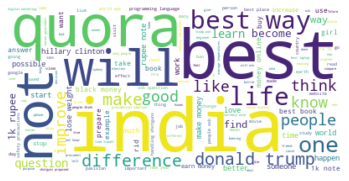

In [52]:
wc = WordCloud(background_color="white", max_words=len(textp_w), stopwords=stopwords)

# generate word cloud
wc.generate(textp_w)

print ("Here are the most frequent occuring words in Duplicate Question pairs:")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

plt.show()

__Word Clouds generated from non duplicate pair question's text__

Here are the most frequent occuring words in Non-Duplicate Question pairs:


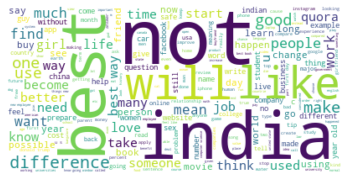

In [51]:
wc = WordCloud(background_color="white", max_words=len(textn_w),stopwords=stopwords)

# generate word cloud
wc.generate(textn_w)

print ("Here are the most frequent occuring words in Non-Duplicate Question pairs:")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

plt.show()

__Pair plot of features ['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio']__

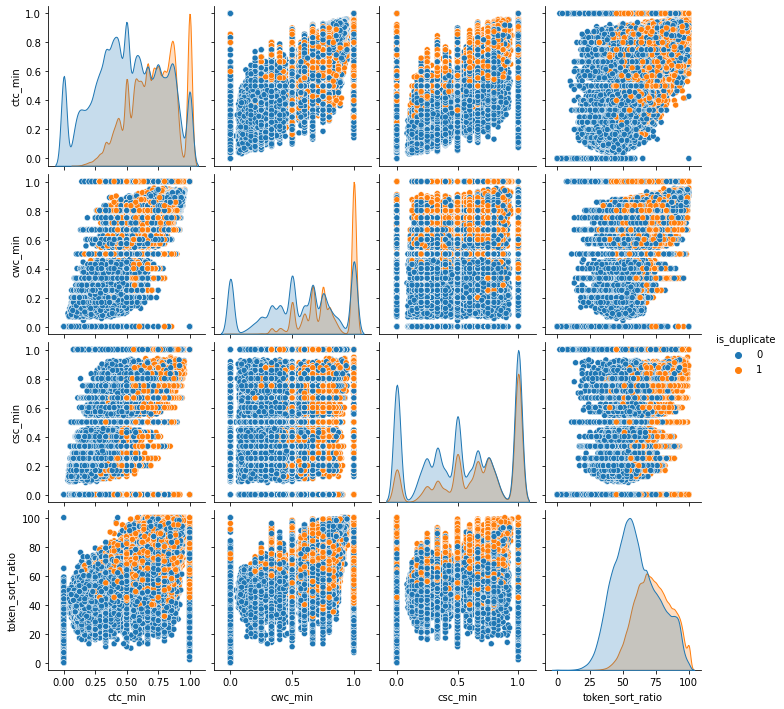

In [53]:
n = df.shape[0]
sns.pairplot(df[['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio', 'is_duplicate']][0:n], hue='is_duplicate', vars=['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio'])

plt.show()

__Distribution of the feature 'token_sort_ratio'__

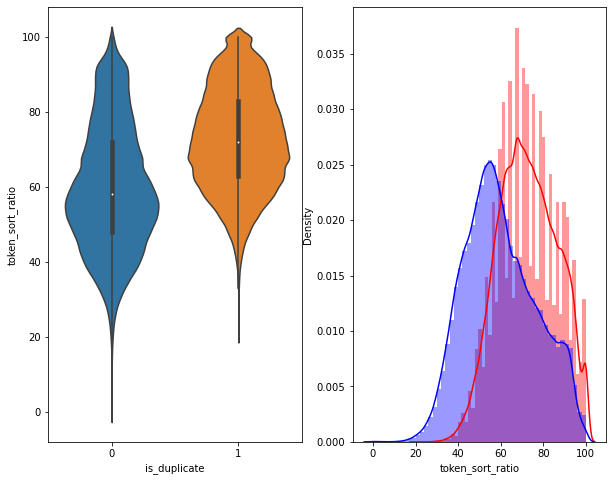

In [57]:
plt.figure(figsize=(10, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'token_sort_ratio', data = df[0:])

plt.subplot(1,2,2)
sns.distplot(df[df['is_duplicate'] == 1.0]['token_sort_ratio'][0:], label = "1", color = 'red')
sns.distplot(df[df['is_duplicate'] == 0.0]['token_sort_ratio'][0:], label = "0" , color = 'blue')

plt.show()

__Distribution of the feature 'fuzz_ratio'__

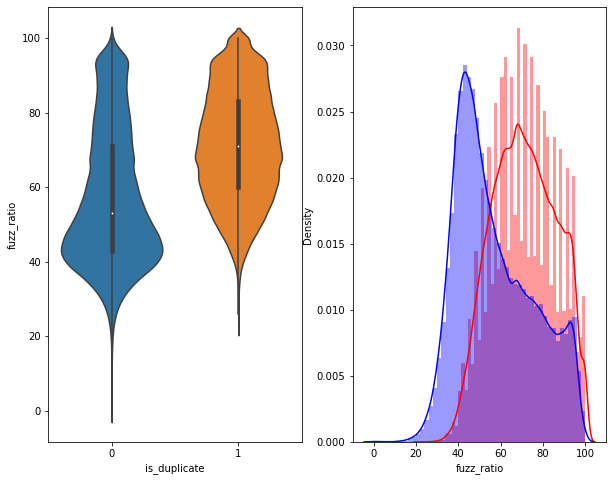

In [58]:
plt.figure(figsize=(10, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'fuzz_ratio', data = df[0:])

plt.subplot(1,2,2)
sns.distplot(df[df['is_duplicate'] == 1.0]['fuzz_ratio'][0:], label = "1", color = 'red')
sns.distplot(df[df['is_duplicate'] == 0.0]['fuzz_ratio'][0:], label = "0" , color = 'blue')

plt.show()

### 6. Visualization

- __t-SNE(2D)__

In [83]:
# Using TSNE for Dimentionality reduction for 15 Features(Generated after cleaning the data) to 3 dimensions

# Sample first 100k rows from the dataset
dfp_subsampled = df[0:100000]

X = MinMaxScaler().fit_transform(dfp_subsampled[['cwc_min', 'cwc_max', 'csc_min', 'csc_max' , 'ctc_min' , 'ctc_max' , 'last_word_eq', 'first_word_eq' , 'abs_len_diff' , 'mean_len' , 'token_set_ratio' , 'token_sort_ratio' ,  'fuzz_ratio' , 'fuzz_partial_ratio' , 'longest_substr_ratio']])
y = dfp_subsampled['is_duplicate'].values

In [84]:
tsne2d = TSNE(
    n_components=2,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.453s...
[t-SNE] Computed neighbors for 100000 samples in 39.080s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional probab

[t-SNE] Iteration 600: error = 2.5341411, gradient norm = 0.0032715 (50 iterations in 24.243s)
[t-SNE] Iteration 650: error = 2.4511263, gradient norm = 0.0030054 (50 iterations in 22.934s)
[t-SNE] Iteration 700: error = 2.3839869, gradient norm = 0.0027943 (50 iterations in 22.543s)
[t-SNE] Iteration 750: error = 2.3284118, gradient norm = 0.0026086 (50 iterations in 22.682s)
[t-SNE] Iteration 800: error = 2.2814791, gradient norm = 0.0024456 (50 iterations in 22.826s)
[t-SNE] Iteration 850: error = 2.2411242, gradient norm = 0.0023043 (50 iterations in 23.926s)
[t-SNE] Iteration 900: error = 2.2059417, gradient norm = 0.0021789 (50 iterations in 25.744s)
[t-SNE] Iteration 950: error = 2.1749399, gradient norm = 0.0020725 (50 iterations in 23.725s)
[t-SNE] Iteration 1000: error = 2.1473384, gradient norm = 0.0019790 (50 iterations in 22.739s)
[t-SNE] KL divergence after 1000 iterations: 2.147338


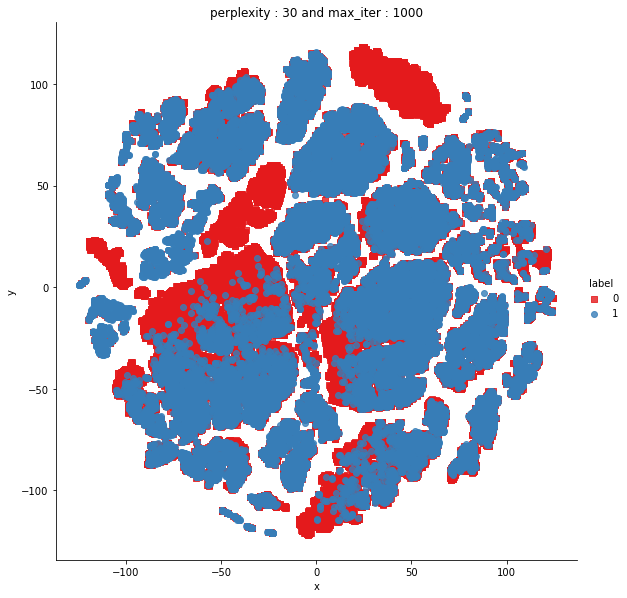

In [85]:
df = pd.DataFrame({'x':tsne2d[:,0], 'y':tsne2d[:,1] ,'label':y})

sns.lmplot(data=df, x='x', y='y', hue='label', fit_reg=False, size=8, palette="Set1", markers=['s','o'])
plt.title("perplexity : {} and max_iter : {}".format(30, 1000))

plt.show()

- __t-SNE(3D)__

In [86]:
tsne3d = TSNE(
    n_components=3,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.448s...
[t-SNE] Computed neighbors for 100000 samples in 39.612s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional probab

[t-SNE] Iteration 600: error = 2.0790412, gradient norm = 0.0010229 (50 iterations in 66.175s)
[t-SNE] Iteration 650: error = 2.0045667, gradient norm = 0.0008995 (50 iterations in 65.874s)
[t-SNE] Iteration 700: error = 1.9468187, gradient norm = 0.0007920 (50 iterations in 65.798s)
[t-SNE] Iteration 750: error = 1.9013901, gradient norm = 0.0006935 (50 iterations in 66.338s)
[t-SNE] Iteration 800: error = 1.8653076, gradient norm = 0.0005984 (50 iterations in 65.838s)
[t-SNE] Iteration 850: error = 1.8369161, gradient norm = 0.0005140 (50 iterations in 65.878s)
[t-SNE] Iteration 900: error = 1.8139235, gradient norm = 0.0004481 (50 iterations in 65.805s)
[t-SNE] Iteration 950: error = 1.7950515, gradient norm = 0.0003863 (50 iterations in 65.998s)
[t-SNE] Iteration 1000: error = 1.7804706, gradient norm = 0.0003084 (50 iterations in 66.250s)
[t-SNE] KL divergence after 1000 iterations: 1.780471


In [87]:
trace1 = go.Scatter3d(
    x=tsne3d[:,0],
    y=tsne3d[:,1],
    z=tsne3d[:,2],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        color = y,
        colorscale = 'Portland',
        colorbar = dict(title = 'duplicate'),
        line=dict(color='rgb(255, 255, 255)'),
        opacity=0.75
    )
)

data=[trace1]
layout=dict(height=800, width=800, title='3d embedding with engineered features')
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='3DBubble')

In [12]:
pickle.dump(STOP_WORDS, open('stop.pkl', 'wb'))

<IPython.core.display.Javascript object>